In [1]:
import infercnvpy as cnv
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import scipy
sc.settings.verbosity = 3
sc.logging.print_header()
sc.set_figure_params(dpi=100, dpi_save=600)
import matplotlib.pyplot as pl
from matplotlib import rcParams
import os

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/umap/d

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.24.4 scipy==1.11.1 pandas==1.3.5 scikit-learn==1.3.0 statsmodels==0.14.0 python-igraph==0.10.6 louvain==0.8.0 pynndescent==0.5.10


# 读取数据

In [2]:
def select_slide(adata, s, batch_key="sample"):
    r"""This function selects the data for one slide from the spatial anndata object.

    :param adata: Anndata object with multiple spatial experiments
    :param s: name of selected experiment
    :param batch_key: column in adata.obs listing experiment name for each location
    """
    slide = adata[adata.obs[batch_key].isin([s]), :].copy()
    s_keys = list(slide.uns["spatial"].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns["spatial"] = {s_spatial: slide.uns["spatial"][s_spatial]}

    return slide

In [3]:
adata_all = sc.read_h5ad("/mnt/g/E-disk/ZJH_KRAS/Workdir/4.Cell2location/cell2location_map/ZJH_KRAS_cell2loc_sp.h5ad")
adata_all

AnnData object with n_obs × n_vars = 8113 × 12453
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'group', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', '_indices', '_scvi_batch', '_scvi_labels', 'CD4_Tcm', 'CD4_Tem', 'Treg', 'CD8_Tem', 'CD8_Tex', 'T_Prolif', 'NK_cells', 'DCs', 'Macro_C1QC', 'Macro_TNFRSF17', 'Mono_MALAT1', 'Mono_IL1RN', 'Fib_CTHRC1', 'Fib_CXCL14', 'Fib_GAL', 'Fib_IGF1', 'Fib_MMP1', 'Fib_PRKG1', 'Pericytes', 'SMCs', 'Epi_01', 'Epi_02', 'Epi_03', 'Epi_04', 'Epi_05', 'Epi_06', 'Epi_07', 'Epi_08', 'Epi_09', 'Epi_10', 'Endothelial_cells', 'B_cells', 'Mast_cells', 'Plasma_cells'
    var: 'gene_ids', 'feature_types', 'genome', 'SYMBOL', 'mt', 'rps', 'mrp', 'rpl', 'duplicated', 'n_cells_by_counts-CRC_MUT_A1', 'mean_counts-CRC_MUT_A1', 'pct_dropout_by_counts-CRC_MUT_A1', 

In [6]:
name="/mnt/g/E-disk/ZJH_KRAS/Spatial_Datadir/"
sample_names=adata_all.obs['sample'].unique()

# 第一个样本

In [74]:
sample_name=sample_names[0]
name="/mnt/g/E-disk/ZJH_KRAS/Spatial_Datadir/"
adata = sc.read_visium(name + str(sample_name) + '/',count_file='filtered_feature_bc_matrix.h5',load_images=True)
adata.obs['sample'] = sample_name
adata.var['SYMBOL'] = adata.var_names
adata.var_names_make_unique()
adata.var['duplicated'] = adata.var['SYMBOL'].duplicated(keep = 'first')
adata = adata[:, ~adata.var['duplicated'].values]
path="/mnt/g/E-disk/ZJH_KRAS/Workdir/17.MIA/"
metadata=pd.read_csv(path+sample_name+"_after_regions_metadata.csv")
metadata.set_index('Barcode', inplace=True)
adata.obs = pd.concat([adata.obs, metadata], axis=1, join="inner")
adata.obs_names=sample_name+"_"+adata.obs_names
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.var.to_csv("gene_infor.csv")

reading /mnt/g/E-disk/ZJH_KRAS/Spatial_Datadir/CRC_MUT_B1/filtered_feature_bc_matrix.h5
 (0:00:00)


/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


normalizing counts per cell
    finished (0:00:00)


In [75]:
df = pd.read_csv('gene_infor_loc.csv')
#加入基因染色体信息
adata.var['chromosome'] = df['chr'].to_list()
adata.var['start'] = df['start'].to_list()
adata.var['end'] = df['end'].to_list()
#去掉NA
adata = adata[: , adata.var.chromosome.notna()]
adata.var.loc[:, ["chromosome", "start", "end"]].head()

,chromosome,start,end
MIR1302-2HG,chr1,29554.0,31109.0
FAM138A,chr1,34554.0,36081.0
OR4F5,chr1,65419.0,71585.0
AL627309.1,chr1,89295.0,133723.0
AL627309.3,chr1,89551.0,91105.0


  0%|          | 0/1 [00:00<?, ?it/s]

... storing 'sample' as categorical
... storing 'orig.ident' as categorical
... storing 'Region' as categorical


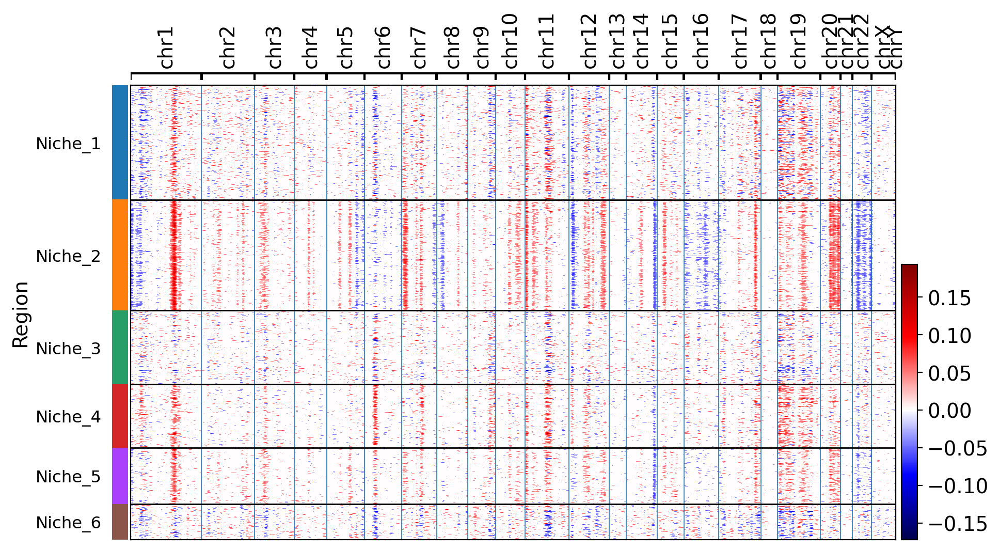

In [76]:
# 运行infercnv分析，将RLT的B细胞作为参考
cnv.tl.infercnv(adata, 
                reference_key='Region', 
                reference_cat='Niche_3', 
                window_size=250, 
                step=10, 
                exclude_chromosomes={'chrMT'}, 
                n_jobs=32)
cnv.pl.chromosome_heatmap(adata, groupby="Region", cmap='seismic', figsize=(10,6), save="_"+sample_name+'_Region.svg', dendrogram=False)

## CNV_umap

computing PCA
    with n_comps=50
    finished (0:00:01)
computing neighbors
    finished: added to `.uns['cnv_neighbors']`
    `.obsp['cnv_neighbors_distances']`, distances for each pair of neighbors
    `.obsp['cnv_neighbors_connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'cnv_leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


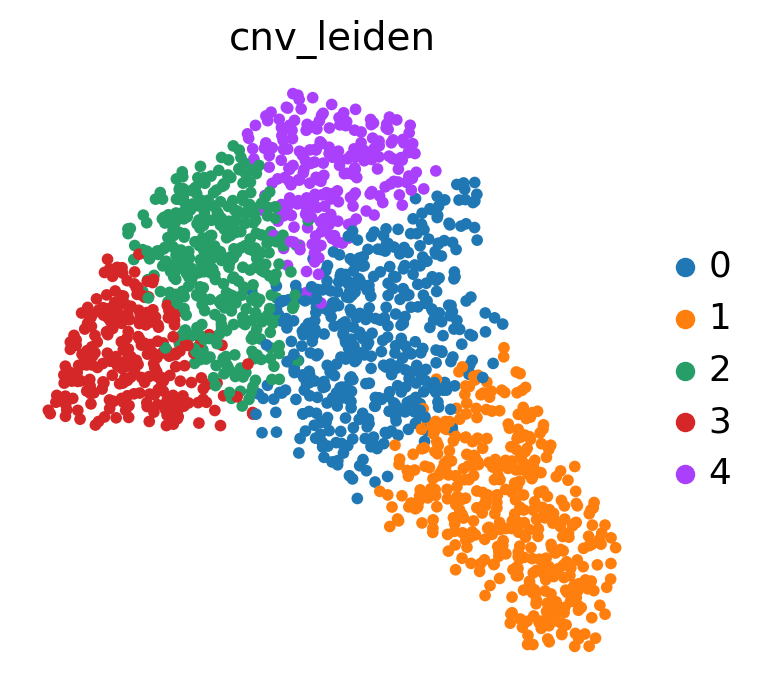

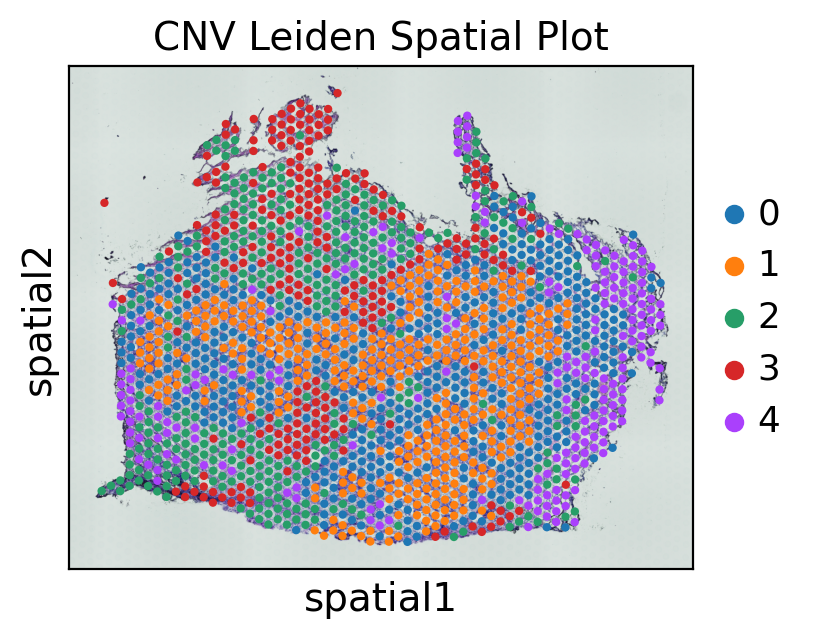

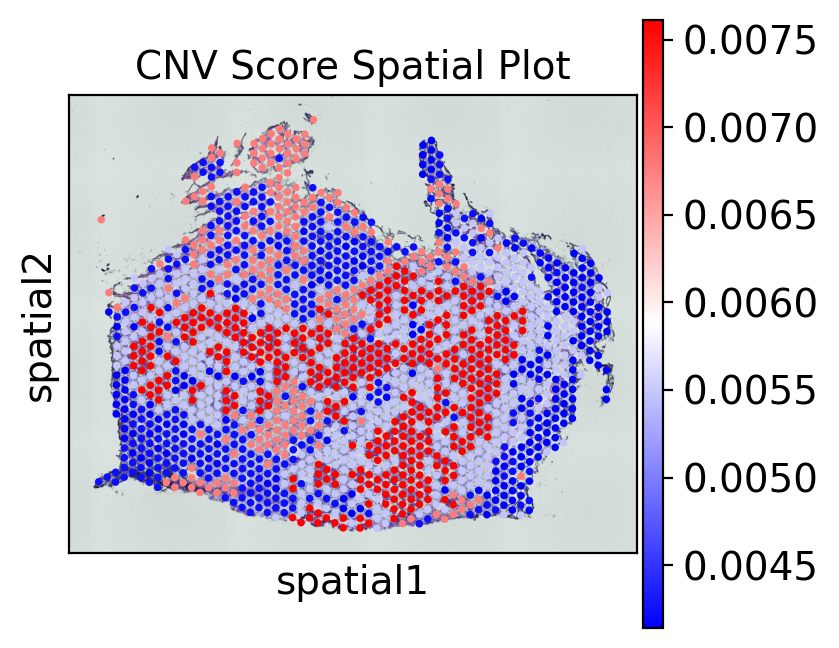

In [79]:
cnv.tl.pca(adata, svd_solver='arpack')
cnv.pp.neighbors(adata, n_neighbors=15, n_pcs=40, knn=True)
cnv.tl.leiden(adata, resolution=0.8)
cnv.tl.umap(adata)
cnv.tl.cnv_score(adata)
name="/mnt/g/E-disk/ZJH_KRAS/Workdir/8.InferCNVpy/ZJH_KRAS_"
adata.obs.to_csv(name+sample_name+"_all_spot_CNV.csv")
adata.write(name+sample_name+"_after_CNV.h5ad",compression='gzip')
# reUMAP the cells based on 'cnv_leiden' calculated from cnv matrix
cnv.pl.umap(adata, color="cnv_leiden", use_raw=None, frameon=False, legend_loc='right margin',save='all_CNVleiden.pdf')
# 绘制 cnv_score 的空间特征图
sc.pl.spatial(adata,color="cnv_leiden",size=1.2,  # 根据需要调整点的大小,不是spot_size
    img_key='hires',title="CNV Leiden Spatial Plot",show=True,save="_"+sample_name+'_CNV_leiden_spatial_plot')
sc.pl.spatial(adata,cmap='bwr',color="cnv_score",size=1.2,  # 根据需要调整点的大小
    title="CNV Score Spatial Plot",show=True,save="_"+sample_name+'_CNV_score_spatial_plot')

# 第二个样本

In [34]:
sample_name=sample_names[1]
name="/mnt/g/E-disk/ZJH_KRAS/Spatial_Datadir/"
adata = sc.read_visium(name + str(sample_name) + '/',count_file='filtered_feature_bc_matrix.h5',load_images=True)
adata.obs['sample'] = sample_name
adata.var['SYMBOL'] = adata.var_names
adata.var_names_make_unique()
adata.var['duplicated'] = adata.var['SYMBOL'].duplicated(keep = 'first')
adata = adata[:, ~adata.var['duplicated'].values]
path="/mnt/g/E-disk/ZJH_KRAS/Workdir/17.MIA/"
metadata=pd.read_csv(path+sample_name+"_after_regions_metadata.csv")
metadata.set_index('Barcode', inplace=True)
adata.obs = pd.concat([adata.obs, metadata], axis=1, join="inner")
adata.obs_names=sample_name+"_"+adata.obs_names
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.var.to_csv("gene_infor.csv")

reading /mnt/g/E-disk/ZJH_KRAS/Spatial_Datadir/CRC_WT_C1/filtered_feature_bc_matrix.h5
 (0:00:00)


/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


normalizing counts per cell
    finished (0:00:00)


In [35]:
df = pd.read_csv('gene_infor_loc.csv')
#加入基因染色体信息
adata.var['chromosome'] = df['chr'].to_list()
adata.var['start'] = df['start'].to_list()
adata.var['end'] = df['end'].to_list()
#去掉NA
adata = adata[: , adata.var.chromosome.notna()]
adata.var.loc[:, ["chromosome", "start", "end"]].head()

,chromosome,start,end
MIR1302-2HG,chr1,29554.0,31109.0
FAM138A,chr1,34554.0,36081.0
OR4F5,chr1,65419.0,71585.0
AL627309.1,chr1,89295.0,133723.0
AL627309.3,chr1,89551.0,91105.0


In [36]:
# 运行infercnv分析，将RLT的B细胞作为参考
cnv.tl.infercnv(adata, 
                reference_key='Region', 
                reference_cat='Niche_3', 
                window_size=250, 
                step=10, 
                exclude_chromosomes={'chrMT'}, 
                n_jobs=32)

  0%|          | 0/1 [00:00<?, ?it/s]

... storing 'sample' as categorical
... storing 'orig.ident' as categorical
... storing 'Region' as categorical


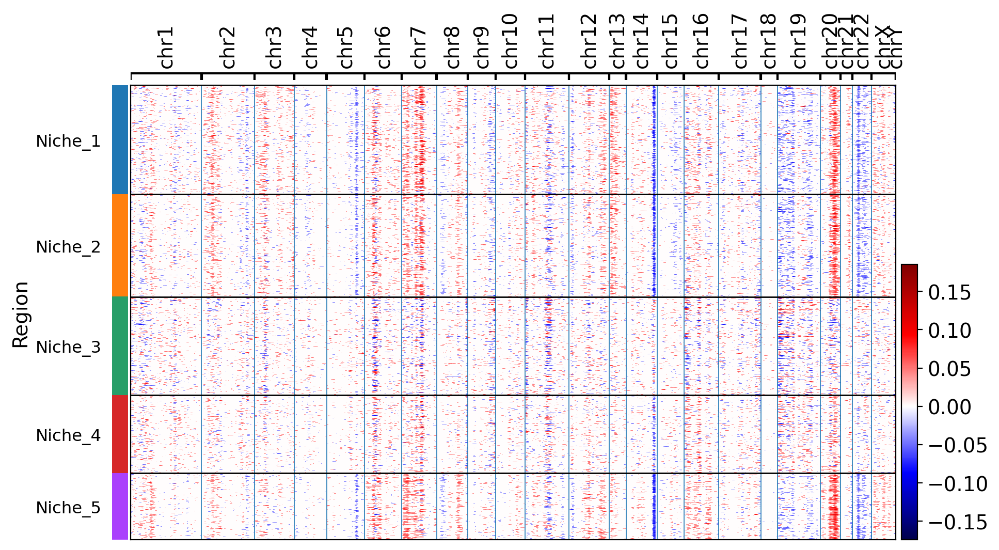

In [37]:
cnv.pl.chromosome_heatmap(adata, groupby="Region", cmap='seismic', figsize=(10,6), save="_"+sample_name+'_Region.svg', dendrogram=False)

## CNV_umap

computing PCA
    with n_comps=50
    finished (0:00:03)
computing neighbors
    finished: added to `.uns['cnv_neighbors']`
    `.obsp['cnv_neighbors_distances']`, distances for each pair of neighbors
    `.obsp['cnv_neighbors_connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'cnv_leiden', the cluster labels (adata.obs, categorical) (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


... storing 'sample' as categorical
... storing 'orig.ident' as categorical
... storing 'Region' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'chromosome' as categorical


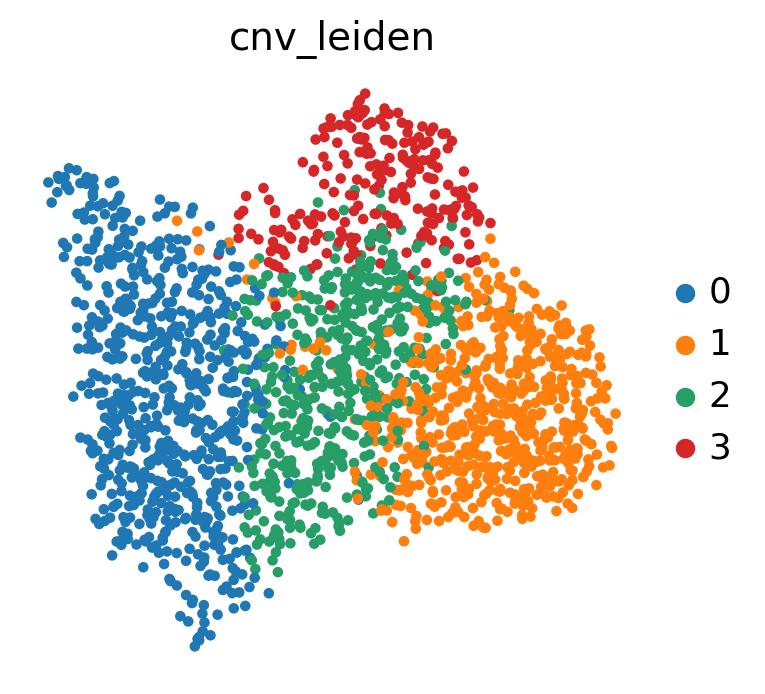

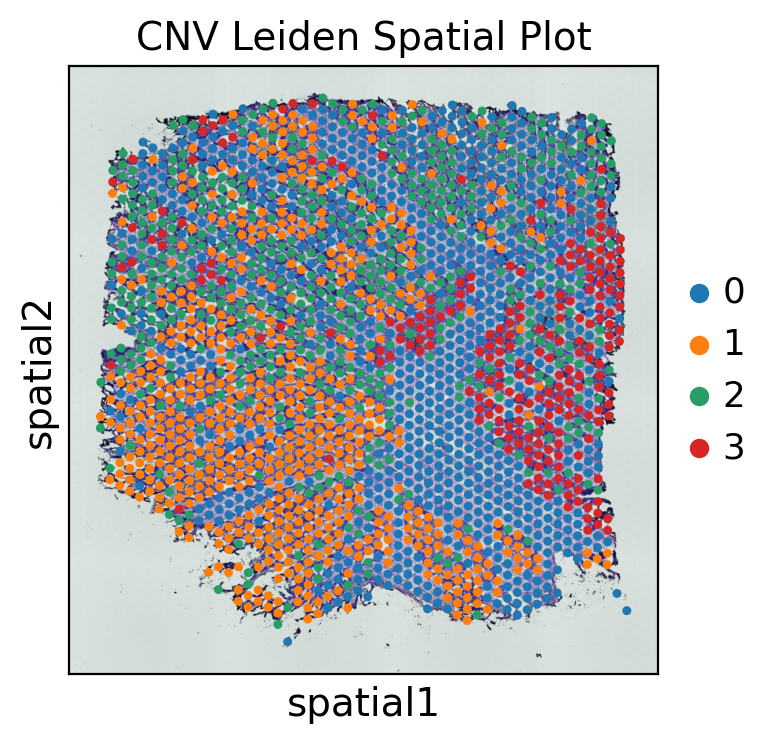

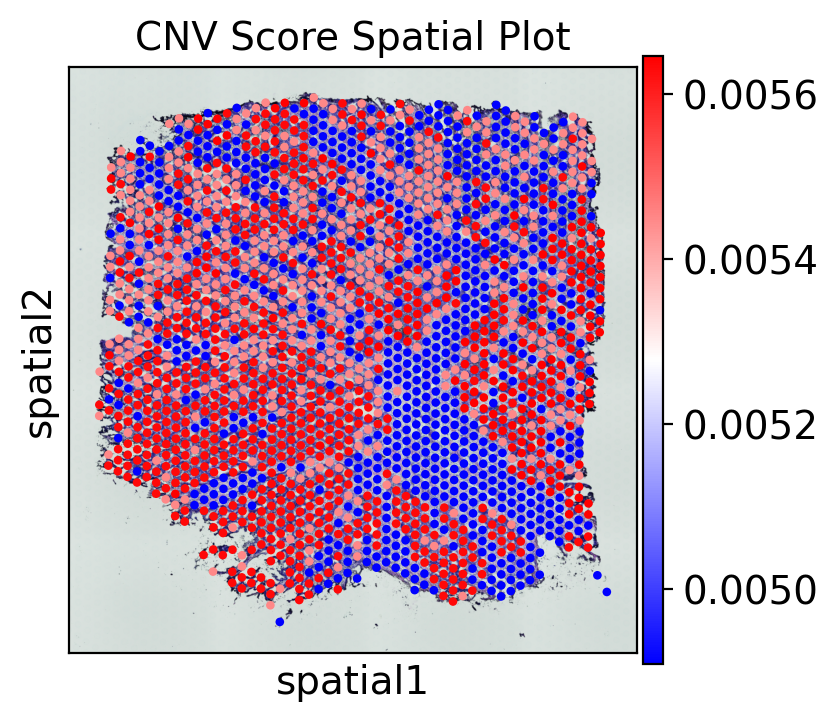

In [38]:
cnv.tl.pca(adata, svd_solver='arpack')
cnv.pp.neighbors(adata, n_neighbors=15, n_pcs=40, knn=True)
cnv.tl.leiden(adata, resolution=0.5)
cnv.tl.umap(adata)
cnv.tl.cnv_score(adata)
name="/mnt/g/E-disk/ZJH_KRAS/Workdir/8.InferCNVpy/ZJH_KRAS_"
adata.obs.to_csv(name+sample_name+"_all_spot_CNV.csv")
adata.write(name+sample_name+"_after_CNV.h5ad",compression='gzip')
# reUMAP the cells based on 'cnv_leiden' calculated from cnv matrix
cnv.pl.umap(adata, color="cnv_leiden", use_raw=None, frameon=False, legend_loc='right margin',save='all_CNVleiden.pdf')
# 绘制 cnv_score 的空间特征图
sc.pl.spatial(adata,color="cnv_leiden",size=1.2,  # 根据需要调整点的大小,不是spot_size
    img_key='hires',title="CNV Leiden Spatial Plot",show=True,save="_"+sample_name+'_CNV_leiden_spatial_plot')
sc.pl.spatial(adata,cmap='bwr',color="cnv_score",size=1.2,  # 根据需要调整点的大小
    title="CNV Score Spatial Plot",show=True,save="_"+sample_name+'_CNV_score_spatial_plot')

# 第三个样本

In [47]:
sample_name=sample_names[2]
name="/mnt/g/E-disk/ZJH_KRAS/Spatial_Datadir/"
adata = sc.read_visium(name + str(sample_name) + '/',count_file='filtered_feature_bc_matrix.h5',load_images=True)
adata.obs['sample'] = sample_name
adata.var['SYMBOL'] = adata.var_names
adata.var_names_make_unique()
adata.var['duplicated'] = adata.var['SYMBOL'].duplicated(keep = 'first')
adata = adata[:, ~adata.var['duplicated'].values]
path="/mnt/g/E-disk/ZJH_KRAS/Workdir/17.MIA/"
metadata=pd.read_csv(path+sample_name+"_after_regions_metadata.csv")
metadata.set_index('Barcode', inplace=True)
adata.obs = pd.concat([adata.obs, metadata], axis=1, join="inner")
adata.obs_names=sample_name+"_"+adata.obs_names
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.var.to_csv("gene_infor.csv")

reading /mnt/g/E-disk/ZJH_KRAS/Spatial_Datadir/CRC_WT_D1/filtered_feature_bc_matrix.h5
 (0:00:00)


/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


normalizing counts per cell
    finished (0:00:00)


In [48]:
df = pd.read_csv('gene_infor_loc.csv')
#加入基因染色体信息
adata.var['chromosome'] = df['chr'].to_list()
adata.var['start'] = df['start'].to_list()
adata.var['end'] = df['end'].to_list()
#去掉NA
adata = adata[: , adata.var.chromosome.notna()]
adata.var.loc[:, ["chromosome", "start", "end"]].head()

,chromosome,start,end
MIR1302-2HG,chr1,29554.0,31109.0
FAM138A,chr1,34554.0,36081.0
OR4F5,chr1,65419.0,71585.0
AL627309.1,chr1,89295.0,133723.0
AL627309.3,chr1,89551.0,91105.0


  0%|          | 0/1 [00:00<?, ?it/s]

... storing 'sample' as categorical
... storing 'orig.ident' as categorical
... storing 'Region' as categorical


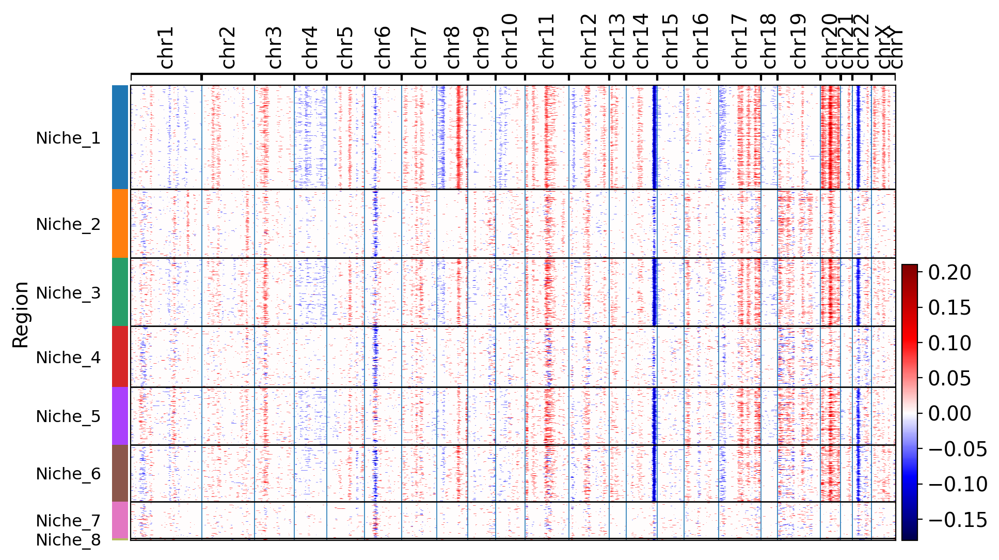

In [49]:
# 运行infercnv分析，将RLT的B细胞作为参考
cnv.tl.infercnv(adata, 
                reference_key='Region', 
                reference_cat='Niche_7', 
                window_size=250, 
                step=10, 
                exclude_chromosomes={'chrMT'}, 
                n_jobs=32)
cnv.pl.chromosome_heatmap(adata, groupby="Region", cmap='seismic', figsize=(10,6), save="_"+sample_name+'_Region.svg', dendrogram=False)

## CNV_umap

computing PCA
    with n_comps=50
    finished (0:00:03)
computing neighbors
    finished: added to `.uns['cnv_neighbors']`
    `.obsp['cnv_neighbors_distances']`, distances for each pair of neighbors
    `.obsp['cnv_neighbors_connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'cnv_leiden', the cluster labels (adata.obs, categorical) (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


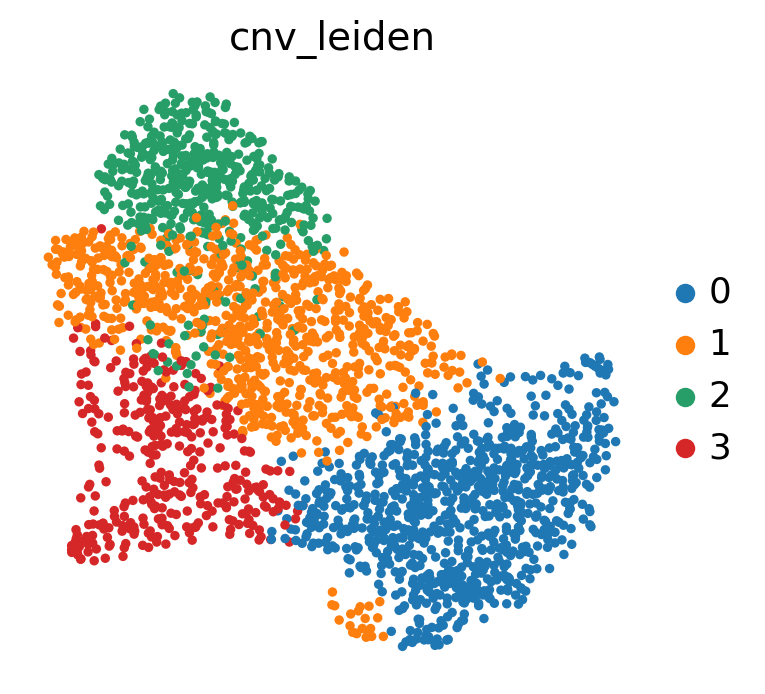

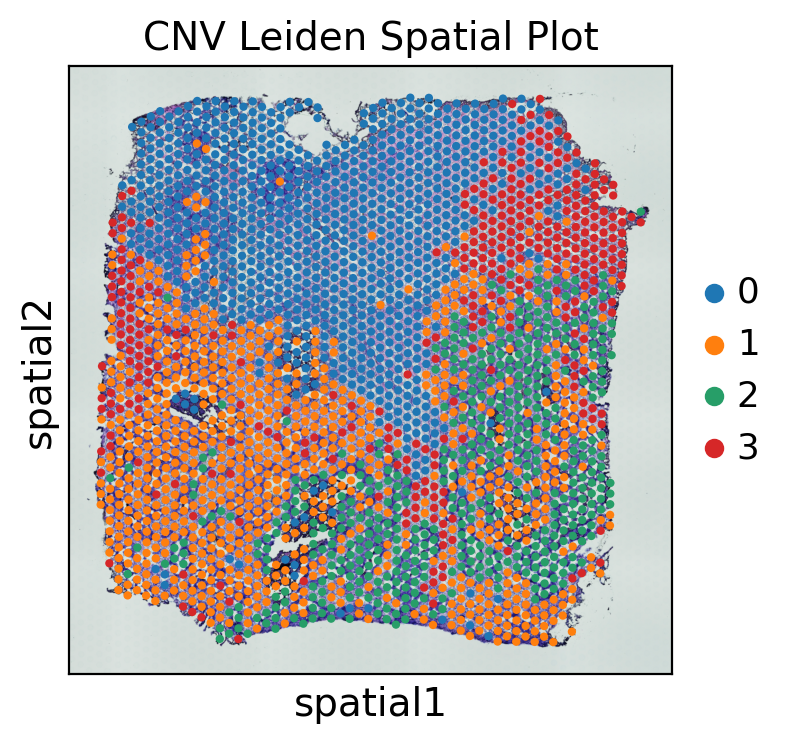

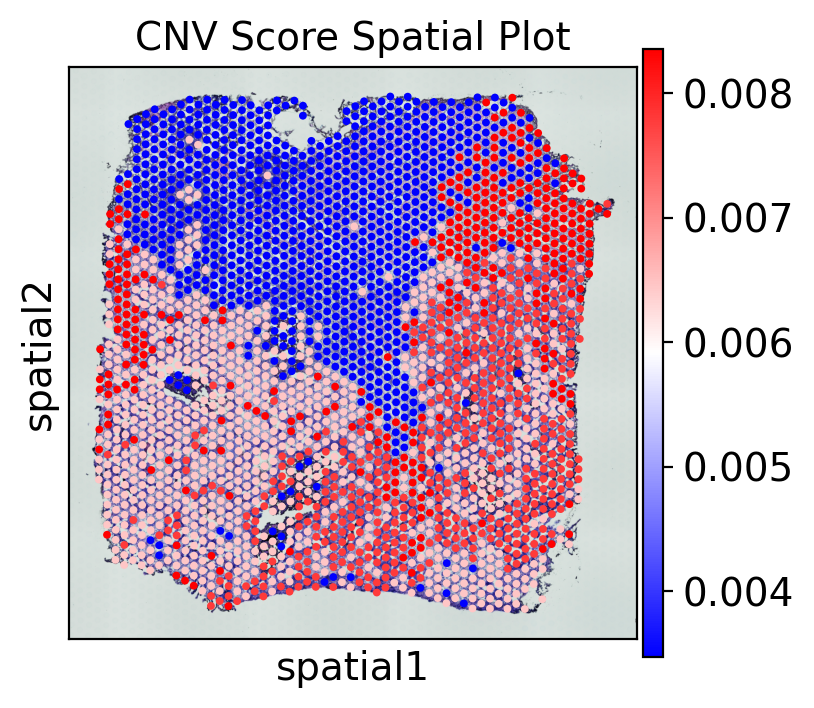

In [51]:
cnv.tl.pca(adata, svd_solver='arpack')
cnv.pp.neighbors(adata, n_neighbors=15, n_pcs=40, knn=True)
cnv.tl.leiden(adata, resolution=0.5)
cnv.tl.umap(adata)
cnv.tl.cnv_score(adata)
name="/mnt/g/E-disk/ZJH_KRAS/Workdir/8.InferCNVpy/ZJH_KRAS_"
adata.obs.to_csv(name+sample_name+"_all_spot_CNV.csv")
adata.write(name+sample_name+"_after_CNV.h5ad",compression='gzip')
# reUMAP the cells based on 'cnv_leiden' calculated from cnv matrix
cnv.pl.umap(adata, color="cnv_leiden", use_raw=None, frameon=False, legend_loc='right margin',save='all_CNVleiden.pdf')
# 绘制 cnv_score 的空间特征图
sc.pl.spatial(adata,color="cnv_leiden",size=1.2,  # 根据需要调整点的大小,不是spot_size
    img_key='hires',title="CNV Leiden Spatial Plot",show=True,save="_"+sample_name+'_CNV_leiden_spatial_plot')
sc.pl.spatial(adata,cmap='bwr',color="cnv_score",size=1.2,  # 根据需要调整点的大小
    title="CNV Score Spatial Plot",show=True,save="_"+sample_name+'_CNV_score_spatial_plot')

# 第四个样本

In [85]:
sample_name=sample_names[3]
name="/mnt/g/E-disk/ZJH_KRAS/Spatial_Datadir/"
adata = sc.read_visium(name + str(sample_name) + '/',count_file='filtered_feature_bc_matrix.h5',load_images=True)
adata.obs['sample'] = sample_name
adata.var['SYMBOL'] = adata.var_names
adata.var_names_make_unique()
adata.var['duplicated'] = adata.var['SYMBOL'].duplicated(keep = 'first')
adata = adata[:, ~adata.var['duplicated'].values]
path="/mnt/g/E-disk/ZJH_KRAS/Workdir/17.MIA/"
metadata=pd.read_csv(path+sample_name+"_after_regions_metadata.csv")
metadata.set_index('Barcode', inplace=True)
adata.obs = pd.concat([adata.obs, metadata], axis=1, join="inner")
adata.obs_names=sample_name+"_"+adata.obs_names
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.var.to_csv("gene_infor.csv")

reading /mnt/g/E-disk/ZJH_KRAS/Spatial_Datadir/CRC_MUT_A1/filtered_feature_bc_matrix.h5
 (0:00:00)


/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


normalizing counts per cell
    finished (0:00:00)


In [86]:
df = pd.read_csv('gene_infor_loc.csv')
#加入基因染色体信息
adata.var['chromosome'] = df['chr'].to_list()
adata.var['start'] = df['start'].to_list()
adata.var['end'] = df['end'].to_list()
#去掉NA
adata = adata[: , adata.var.chromosome.notna()]
adata.var.loc[:, ["chromosome", "start", "end"]].head()

,chromosome,start,end
MIR1302-2HG,chr1,29554.0,31109.0
FAM138A,chr1,34554.0,36081.0
OR4F5,chr1,65419.0,71585.0
AL627309.1,chr1,89295.0,133723.0
AL627309.3,chr1,89551.0,91105.0


  0%|          | 0/1 [00:00<?, ?it/s]

... storing 'sample' as categorical
... storing 'orig.ident' as categorical
... storing 'Region' as categorical


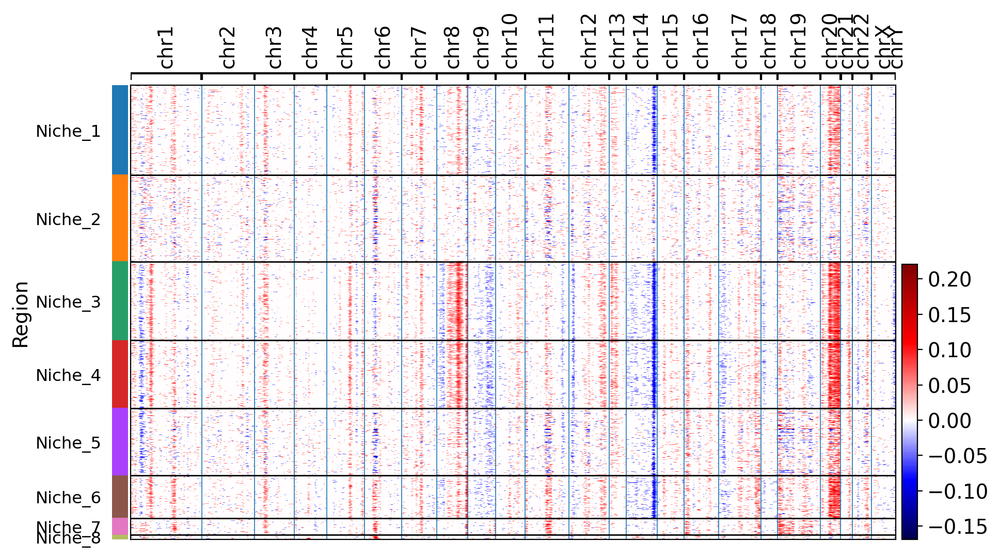

In [87]:
# 运行infercnv分析，将RLT的B细胞作为参考
cnv.tl.infercnv(adata, 
                reference_key='Region', 
                reference_cat='Niche_2', 
                window_size=250, 
                step=10, 
                exclude_chromosomes={'chrMT'}, 
                n_jobs=32)
cnv.pl.chromosome_heatmap(adata, groupby="Region", cmap='seismic', figsize=(10,6), save="_"+sample_name+'_Region.svg', dendrogram=False)

## CNV_umap

computing PCA
    with n_comps=50
    finished (0:00:01)
computing neighbors
    finished: added to `.uns['cnv_neighbors']`
    `.obsp['cnv_neighbors_distances']`, distances for each pair of neighbors
    `.obsp['cnv_neighbors_connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'cnv_leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


... storing 'sample' as categorical
... storing 'orig.ident' as categorical
... storing 'Region' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'chromosome' as categorical


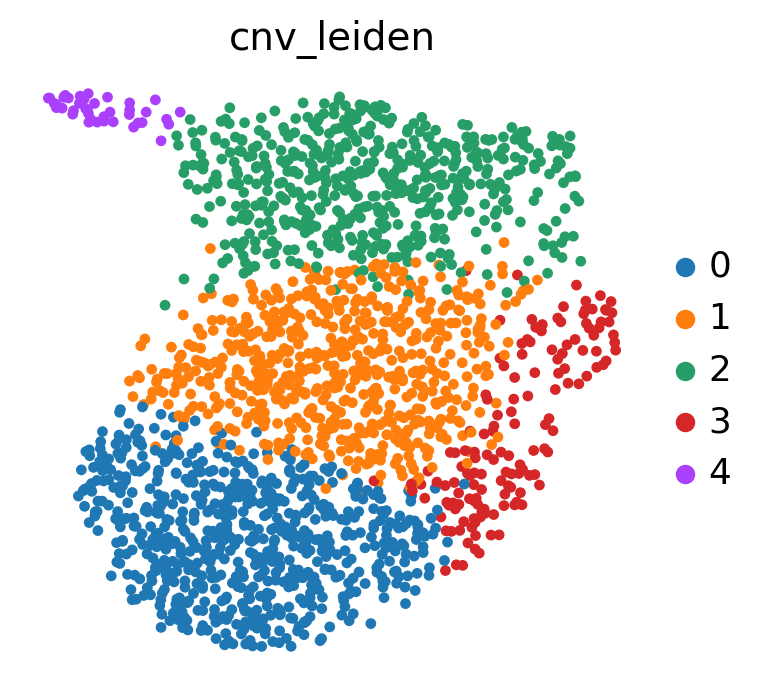

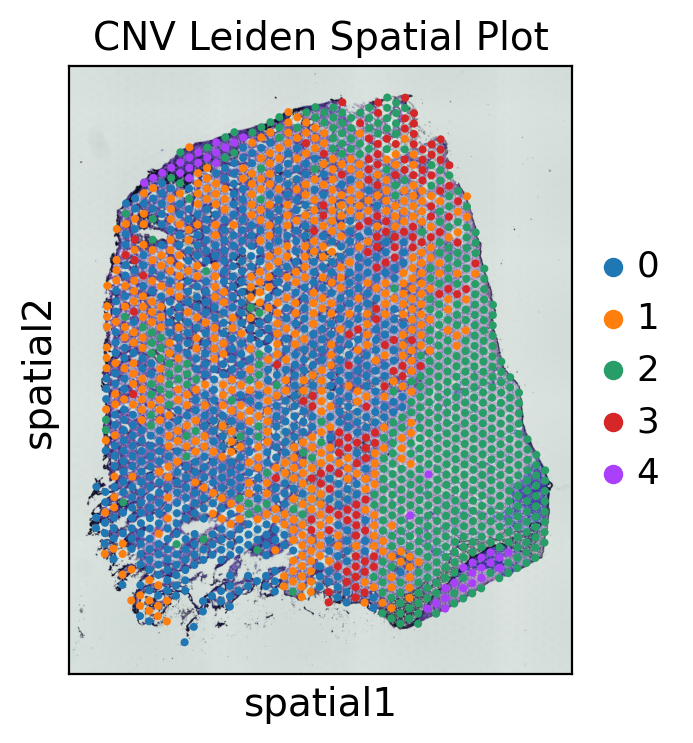

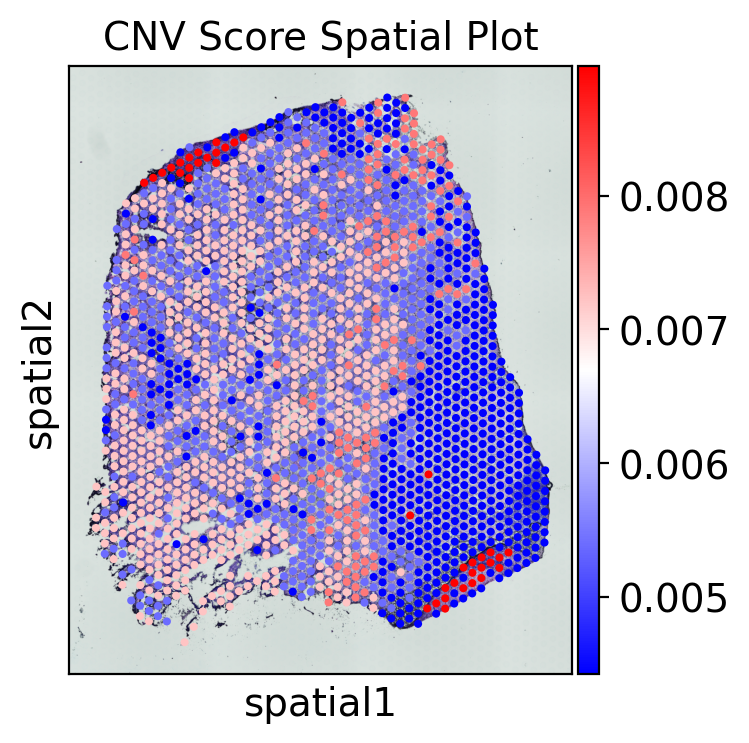

In [88]:
cnv.tl.pca(adata, svd_solver='arpack')
cnv.pp.neighbors(adata, n_neighbors=15, n_pcs=40, knn=True)
cnv.tl.leiden(adata, resolution=0.6)
cnv.tl.umap(adata)
cnv.tl.cnv_score(adata)
name="/mnt/g/E-disk/ZJH_KRAS/Workdir/8.InferCNVpy/ZJH_KRAS_"
adata.obs.to_csv(name+sample_name+"_all_spot_CNV.csv")
adata.write(name+sample_name+"_after_CNV.h5ad",compression='gzip')
# reUMAP the cells based on 'cnv_leiden' calculated from cnv matrix
cnv.pl.umap(adata, color="cnv_leiden", use_raw=None, frameon=False, legend_loc='right margin',save='all_CNVleiden.pdf')
# 绘制 cnv_score 的空间特征图
sc.pl.spatial(adata,color="cnv_leiden",size=1.2,  # 根据需要调整点的大小,不是spot_size
    img_key='hires',title="CNV Leiden Spatial Plot",show=True,save="_"+sample_name+'_CNV_leiden_spatial_plot')
sc.pl.spatial(adata,cmap='bwr',color="cnv_score",size=1.2,  # 根据需要调整点的大小
    title="CNV Score Spatial Plot",show=True,save="_"+sample_name+'_CNV_score_spatial_plot')